In [1]:
import numpy as np
import matplotlib.pyplot as plt
import xarray as xr
import pandas as pd
import verde as vd
import harmonica as hm
import boule as bl
import ensaio
import pygmt
import pyproj

import utm
import geopandas as gpdm

import pathlib
import os

import warnings
warnings.filterwarnings("ignore")

# Load gravity data table

In [2]:
# path_gravity = ensaio.fetch_southern_africa_gravity(version=1)
# path_topography = ensaio.fetch_earth_topography(version=1)
# path_geoid  = ensaio.fetch_earth_geoid(version=1)

data_dir = pathlib.Path("..") / "data"
image_dir = pathlib.Path("..") / "report" / "figures"
shape_dir = pathlib.Path("..") / "data" / "shapefile"

mpl_rc = {"text.usetex": True, "font.family": "serif", "font.size": 9}

Read shapefile

In [3]:
GranitoFoliado = os.path.join(shape_dir/"Granito_Foliado_reproj.shp")
Mistura = os.path.join(shape_dir/"Mistura_reproj.shp")
Nucleo1 = os.path.join(shape_dir/"nucleo1_reproj.shp")
Nocleo2 = os.path.join(shape_dir/"nucleo2_reproj.shp")

In [4]:
# data = pd.read_csv(path_gravity)
data = pd.read_csv(data_dir/'gravity_table.csv', delimiter=';')
data

,Station,Reading,Time,Date,height_sea_level_m,X,Y,longitude,latitude,gravity_mgal,TideCorr,Source
0,1,2239.39,14:28:00,2019/12/03,147.94,238246.104213,7.702141e+06,-41.514018,-20.762135,978591.406605,0.053423,03122019_996
1,2,2239.41,15:12:00,2019/12/03,152.06,239573.565307,7.702483e+06,-41.501226,-20.759230,978591.445776,0.066119,03122019_996
2,3,2246.38,16:06:00,2019/12/03,117.30,241216.748955,7.704176e+06,-41.485206,-20.744179,978598.473518,0.077715,03122019_996
3,4,2245.71,16:46:00,2019/12/03,129.10,243071.287960,7.702906e+06,-41.467595,-20.755897,978597.809879,0.081974,03122019_996
4,5,2249.62,17:13:00,2019/12/03,130.01,245332.547009,7.701803e+06,-41.446052,-20.766168,978601.745635,0.082319,03122019_996
...,...,...,...,...,...,...,...,...,...,...,...,...
222,223,2203015.00,17:06:00,2019/12/16,264.94,245174.133206,7.717189e+06,-41.445344,-20.627243,978555.178643,0.096166,16122019_996
223,224,2168435.00,09:38:00,2019/12/17,204.11,239604.189758,7.711266e+06,-41.499631,-20.679943,978573.732084,-0.030230,17122019_965
224,225,2164.15,11:52:00,2019/12/17,226.73,237502.245723,7.711667e+06,-41.519734,-20.676036,978569.446411,0.024382,17122019_965
225,226,2135695.00,15:49:00,2019/12/17,443.57,240697.890125,7.698939e+06,-41.490961,-20.791377,978540.768876,0.125092,17122019_965


In [5]:
# West, East, South, North (degrees)
region = (-41.5572222222, -41.2802777778, -20.8008333333, -20.5533333333)
# Pad the region for slicing the grids
region_pad = vd.pad_region(region, pad=0.02)

In [6]:
topography = pygmt.datasets.load_earth_relief(resolution="01s", region=region_pad)
topography = topography.rename({'lon': 'longitude', 'lat': 'latitude'})
topography

<xarray.DataArray 'elevation' (latitude: 1051, longitude: 1156)>
array([[772., 763., 752., ..., 137., 134., 128.],
       [783., 771., 760., ..., 136., 132., 126.],
       [789., 779., 764., ..., 134., 129., 122.],
       ...,
       [770., 777., 786., ..., 260., 265., 269.],
       [783., 789., 798., ..., 261., 265., 271.],
       [796., 803., 810., ..., 259., 261., 267.]], dtype=float32)
Coordinates:
  * longitude  (longitude) float64 -41.58 -41.58 -41.58 ... -41.26 -41.26 -41.26
  * latitude   (latitude) float64 -20.82 -20.82 -20.82 ... -20.53 -20.53 -20.53
Attributes:
    long_name:         Earth elevation relative to the geoid
    cpt:               geo
    units:             meters
    vertical_datum:    EGM96
    horizontal_datum:  WGS84

In [7]:
topography = topography.sel(longitude=slice(*region_pad[:2]), latitude=slice(*region_pad[2:]))
# topography = topography.sel(lon=slice(*region_pad[:2]), lat=slice(*region_pad[2:]))
topography

<xarray.DataArray 'elevation' (latitude: 1035, longitude: 1140)>
array([[682., 690., 696., ..., 106., 107., 113.],
       [686., 697., 702., ..., 107., 108., 115.],
       [689., 697., 707., ..., 106., 108., 114.],
       ...,
       [820., 806., 795., ..., 279., 281., 281.],
       [827., 816., 806., ..., 280., 283., 286.],
       [830., 821., 812., ..., 288., 294., 301.]], dtype=float32)
Coordinates:
  * longitude  (longitude) float64 -41.58 -41.58 -41.58 ... -41.26 -41.26 -41.26
  * latitude   (latitude) float64 -20.82 -20.82 -20.82 ... -20.53 -20.53 -20.53
Attributes:
    long_name:         Earth elevation relative to the geoid
    cpt:               geo
    units:             meters
    vertical_datum:    EGM96
    horizontal_datum:  WGS84

In [8]:
geoid = pygmt.datasets.load_earth_geoid(resolution="01m", region=region_pad, registration="gridline")
geoid = geoid.rename({'lon': 'longitude', 'lat': 'latitude'})

geoid = geoid.sel(longitude=slice(*region_pad[:2]), latitude=slice(*region_pad[2:]))
interpolator = vd.KNeighbors()

geoid_table = vd.grid_to_table(geoid)
geoid_1 = vd.grid_to_table(topography)


interpolator.fit((geoid_table.longitude, geoid_table.latitude), geoid_table.earth_geoid)
geoid_1 = geoid_1.assign(elevation=interpolator.predict((geoid_1.longitude, geoid_1.latitude)))

geoid_values = np.reshape(geoid_1.elevation, topography.shape)
geoid = xr.DataArray(geoid_values, coords=[topography.latitude, topography.longitude], dims=['latitude', 'longitude'])
geoid

grdcut [WARNING]: (w - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: w reset from -41.5772222222 to -41.5833333333
grdcut [WARNING]: (e - x_min) must equal (NX + eps) * x_inc), where NX is an integer and |eps| <= 0.0001.
grdcut [WARNING]: e reset from -41.2602777778 to -41.25
grdcut [WARNING]: (s - y_min) must equal (NY + eps) * y_inc), where NY is an integer and |eps| <= 0.0001.
grdcut [WARNING]: s reset from -20.8208333333 to -20.8333333333


<xarray.DataArray (latitude: 1035, longitude: 1140)>
array([[-6.08     , -6.08     , -6.08     , ..., -6.7799997, -6.7799997,
        -6.7799997],
       [-6.08     , -6.08     , -6.08     , ..., -6.7799997, -6.7799997,
        -6.7799997],
       [-6.08     , -6.08     , -6.08     , ..., -6.7799997, -6.7799997,
        -6.7799997],
       ...,
       [-5.72     , -5.72     , -5.72     , ..., -6.37     , -6.37     ,
        -6.37     ],
       [-5.72     , -5.72     , -5.72     , ..., -6.37     , -6.37     ,
        -6.37     ],
       [-5.72     , -5.72     , -5.72     , ..., -6.37     , -6.37     ,
        -6.37     ]], dtype=float32)
Coordinates:
  * latitude   (latitude) float64 -20.82 -20.82 -20.82 ... -20.53 -20.53 -20.53
  * longitude  (longitude) float64 -41.58 -41.58 -41.58 ... -41.26 -41.26 -41.26

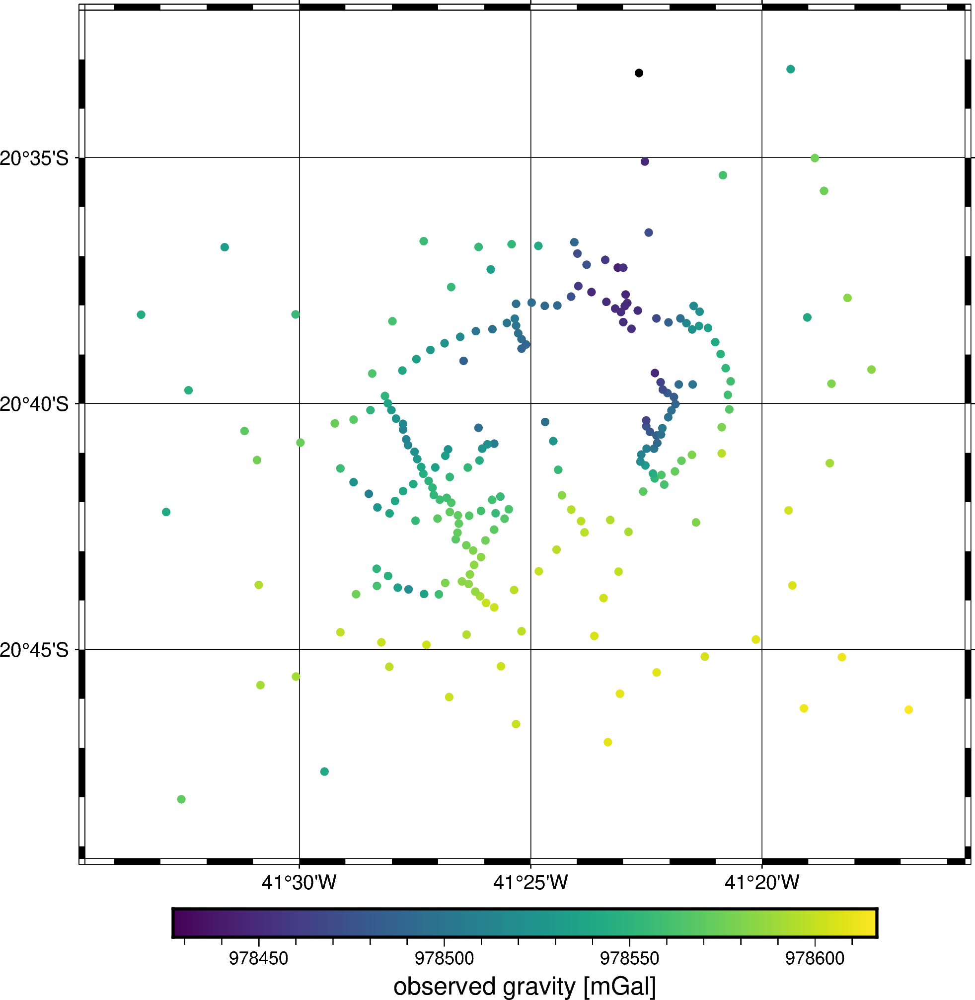

In [9]:
fig = pygmt.Figure()
pygmt.makecpt(cmap="viridis", series=[data.gravity_mgal.min(), data.gravity_mgal.max()])
fig.plot(
    x=data.longitude,
    y=data.latitude,
    color=data.gravity_mgal,
    cmap=True,
    style="c4p",
    projection="M15c",
    frame="afg",
)
fig.colorbar(frame='af+l"observed gravity [mGal]"')

fig.show(width=600)

ERROR 1: Features without geometry not supported by GMT writer.


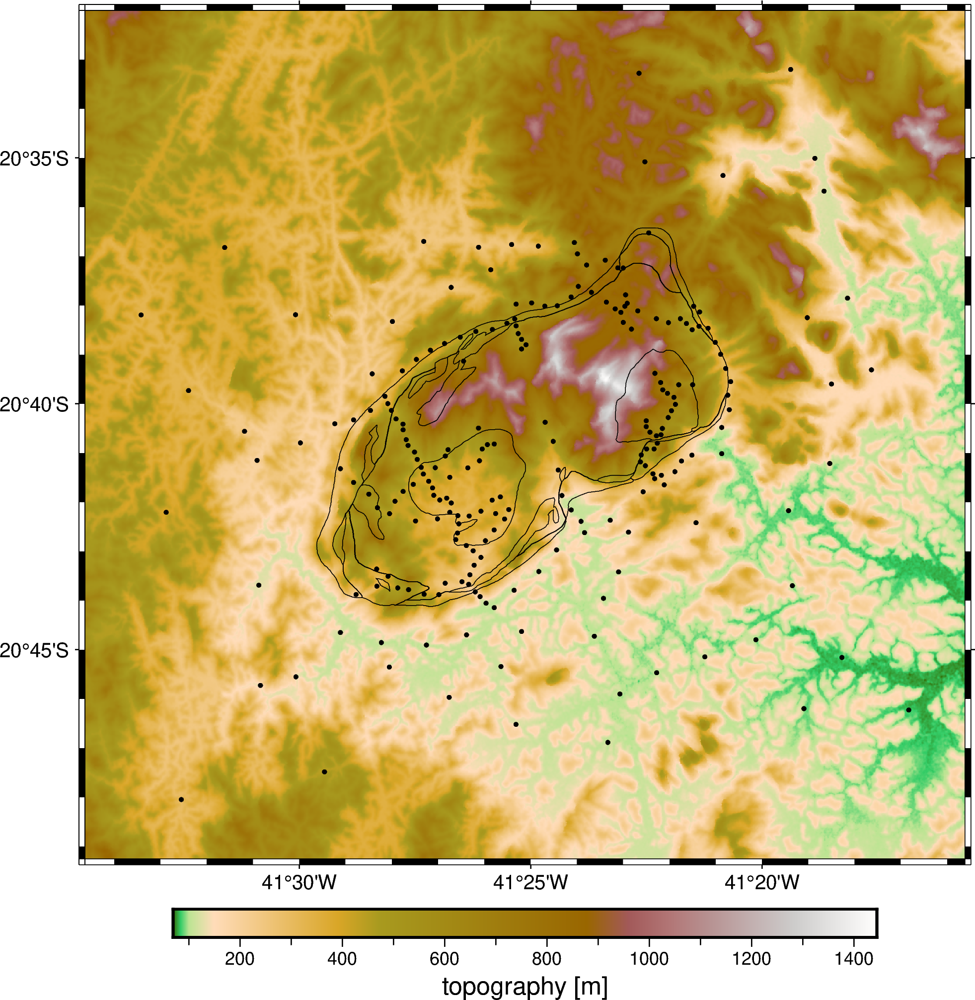

In [10]:
fig = pygmt.Figure()
fig.grdimage(topography, projection="M15c", cmap="etopo1", frame=True)
fig.colorbar(frame='af+l"topography [m]"')
fig.coast(shorelines="white", area_thresh=1e6)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    style="c0.08c",
    color="black",
)
fig.plot(data=GranitoFoliado, projection='M')
fig.plot(data=Mistura, projection='M')
fig.plot(data=Nucleo1, projection='M')
fig.plot(data=Nocleo2, projection='M')
fig.show(width=600)

ERROR 1: Features without geometry not supported by GMT writer.


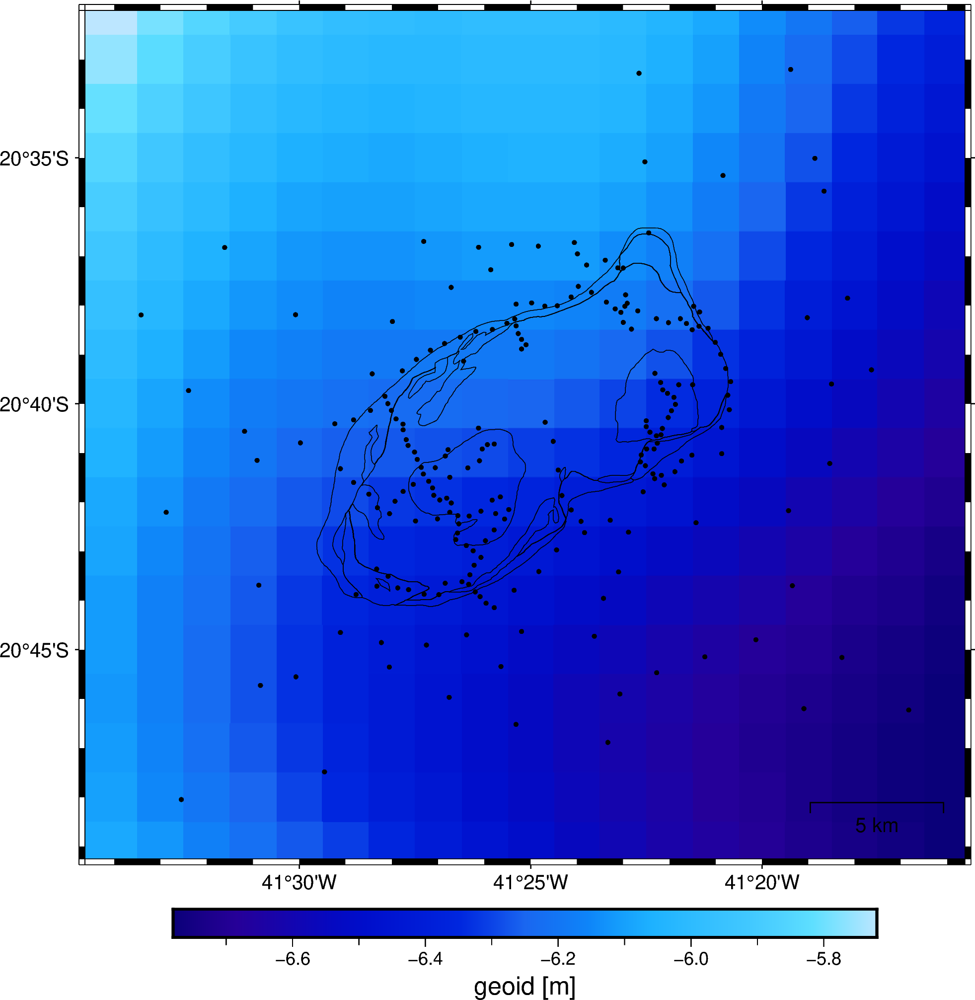

In [11]:
fig = pygmt.Figure()
fig.grdimage(geoid, projection="M15c", cmap="etopo1", frame=True)
fig.colorbar(frame='af+l"geoid [m]"')
fig.coast(shorelines="white", area_thresh=1e6)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    style="c0.08c",
    color="black",
)
fig.plot(data=GranitoFoliado, projection='M')
fig.plot(data=Mistura, projection='M')
fig.plot(data=Nucleo1, projection='M')
fig.plot(data=Nocleo2, projection='M')
fig.basemap(map_scale="n0.9/0.06+w5k+u")
fig.show(width=600)

## Converte altitudes ortométricas para geométricas

In [12]:
topography_geometric = topography + geoid
topography_geometric

<xarray.DataArray (latitude: 1035, longitude: 1140)>
array([[675.92, 683.92, 689.92, ...,  99.22, 100.22, 106.22],
       [679.92, 690.92, 695.92, ..., 100.22, 101.22, 108.22],
       [682.92, 690.92, 700.92, ...,  99.22, 101.22, 107.22],
       ...,
       [814.28, 800.28, 789.28, ..., 272.63, 274.63, 274.63],
       [821.28, 810.28, 800.28, ..., 273.63, 276.63, 279.63],
       [824.28, 815.28, 806.28, ..., 281.63, 287.63, 294.63]],
      dtype=float32)
Coordinates:
  * longitude  (longitude) float64 -41.58 -41.58 -41.58 ... -41.26 -41.26 -41.26
  * latitude   (latitude) float64 -20.82 -20.82 -20.82 ... -20.53 -20.53 -20.53

ERROR 1: Features without geometry not supported by GMT writer.


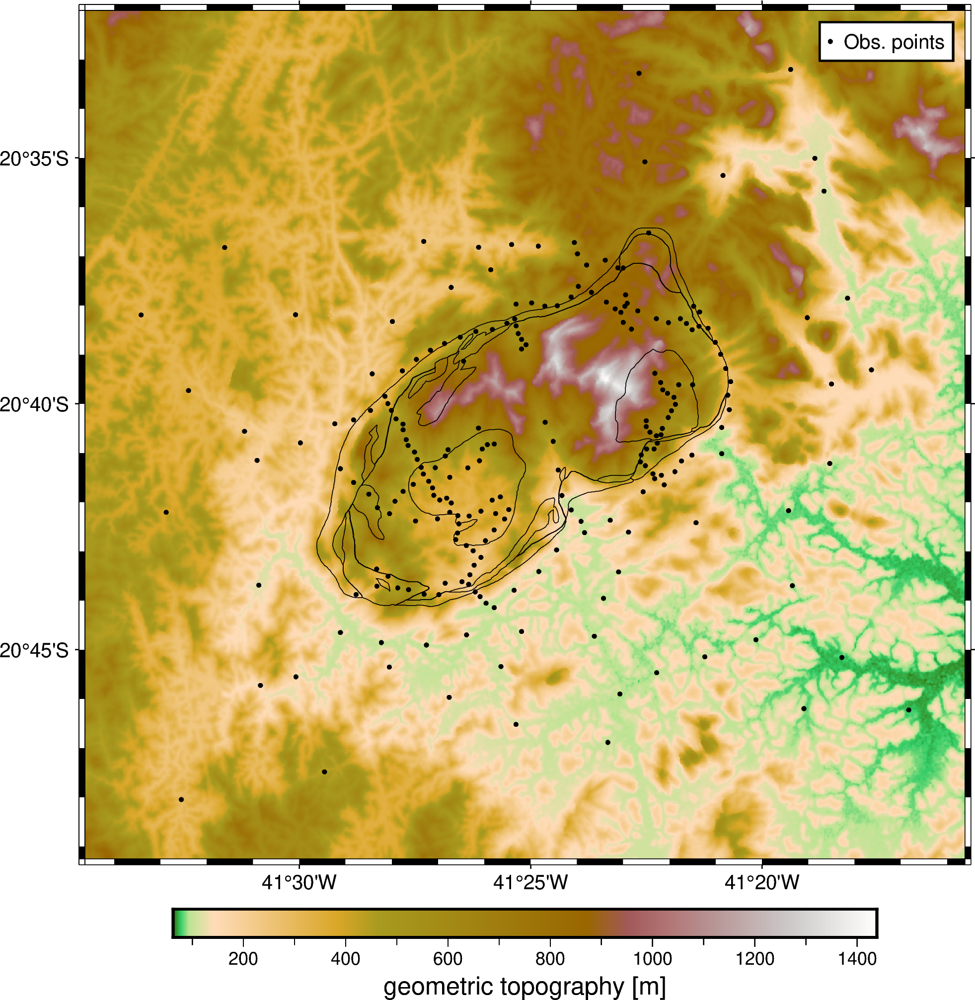

In [13]:
fig = pygmt.Figure()
fig.grdimage(topography_geometric, projection="M15c", cmap="etopo1", frame=True)
fig.colorbar(frame='af+l"geometric topography [m]"')
fig.coast(shorelines="white", area_thresh=1e6)
fig.plot(
    x=data.longitude,
    y=data.latitude,
    style="c0.08c",
    color="black",
    label='Obs. points'
)
fig.legend()
fig.plot(data=GranitoFoliado, projection='M')
fig.plot(data=Mistura, projection='M')
fig.plot(data=Nucleo1, projection='M')
fig.plot(data=Nocleo2, projection='M')
fig.show(width=600)

ERROR 1: Features without geometry not supported by GMT writer.
ERROR 1: Features without geometry not supported by GMT writer.
ERROR 1: Features without geometry not supported by GMT writer.


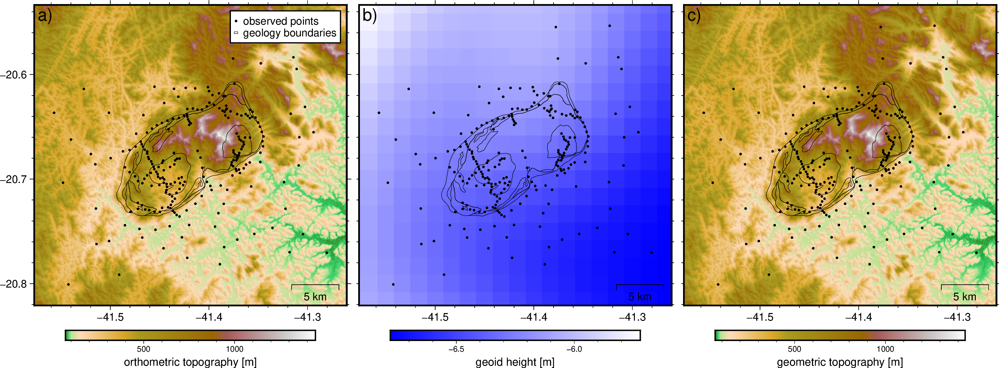

In [14]:
with plt.rc_context(mpl_rc):
    fig = pygmt.Figure()
    # pygmt.config(FORMAT_GEO_MAP="ddd.xx")
    with fig.subplot(
        nrows=1, ncols=3, figsize=("32c", "10c"), autolabel=True, margins="-0.05c"
    ):
        with fig.set_panel(panel=0):
            
            fig.grdimage(topography, projection="X", cmap="etopo1", frame=["WSne", "xaf", "yaf"],
                        shading="+a45+nt0.15")# frame=["WSne", "xafg+lx-axis", "yafg+ly-axis"])
            fig.colorbar(frame='af+l"orthometric topography [m]"')
            fig.plot(
                        x=data.longitude,
                        y=data.latitude,
                        style="c0.08c",
                        color="black",
                        label='observed points'
                    )
            fig.plot(data=GranitoFoliado, projection='M', label='geology boundaries')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.legend()
            fig.basemap(map_scale="n0.9/0.06+w5k+u")
    
    
        with fig.set_panel(panel=1):
            fig.grdimage(geoid, projection="X", cmap="polar+h", frame=["WSne", "xaf", "f"])
            fig.colorbar(frame='af+l"geoid height [m]"')
            fig.plot(
                        x=data.longitude,
                        y=data.latitude,
                        style="c0.08c",
                        color="black",
                    )
            fig.plot(data=GranitoFoliado, projection='M')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')   
            fig.basemap(map_scale="n0.9/0.06+w5k+u")
        
        with fig.set_panel(panel=2):
            fig.grdimage(topography_geometric, projection="X", cmap="etopo1", frame=["WSne", "xaf", "f"],
                        shading="+a45+nt0.15")
            fig.colorbar(frame='af+l"geometric topography [m]"')
            fig.plot(
                        x=data.longitude,
                        y=data.latitude,
                        style="c0.08c",
                        color="black",
                    )

            fig.plot(data=GranitoFoliado, projection='M')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.basemap(map_scale="n0.9/0.06+w5k+u")

fig.savefig(image_dir / 'heights.png', dpi=300)
fig.show()


In [15]:
geoid_table = vd.grid_to_table(geoid)
interpolator = vd.KNeighbors()
interpolator.fit((geoid_table.longitude, geoid_table.latitude), geoid_table.scalars)
data = data.assign(geoid_m=interpolator.predict((data.longitude, data.latitude)))
data = data.assign(height_geometric_m=data.height_sea_level_m + data.geoid_m)
# data
# geoid_table

## Distúrbio da gravidade

In [16]:
data = data.assign(
    normal_gravity_mgal=bl.WGS84.normal_gravity(data.latitude, data.height_geometric_m)
)
data = data.assign(gravity_disturbance_mgal=data.gravity_mgal - data.normal_gravity_mgal)
data

,Station,Reading,Time,Date,height_sea_level_m,X,Y,longitude,latitude,gravity_mgal,TideCorr,Source,geoid_m,height_geometric_m,normal_gravity_mgal,gravity_disturbance_mgal
0,1,2239.39,14:28:00,2019/12/03,147.94,238246.104213,7.702141e+06,-41.514018,-20.762135,978591.406605,0.053423,03122019_996,-6.28,141.66,978637.965812,-46.559207
1,2,2239.41,15:12:00,2019/12/03,152.06,239573.565307,7.702483e+06,-41.501226,-20.759230,978591.445776,0.066119,03122019_996,-6.33,145.73,978636.535699,-45.089923
2,3,2246.38,16:06:00,2019/12/03,117.30,241216.748955,7.704176e+06,-41.485206,-20.744179,978598.473518,0.077715,03122019_996,-6.38,110.92,978646.381983,-47.908465
3,4,2245.71,16:46:00,2019/12/03,129.10,243071.287960,7.702906e+06,-41.467595,-20.755897,978597.809879,0.081974,03122019_996,-6.41,122.69,978643.448921,-45.639042
4,5,2249.62,17:13:00,2019/12/03,130.01,245332.547009,7.701803e+06,-41.446052,-20.766168,978601.745635,0.082319,03122019_996,-6.46,123.55,978643.797668,-42.052034
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,223,2203015.00,17:06:00,2019/12/16,264.94,245174.133206,7.717189e+06,-41.445344,-20.627243,978555.178643,0.096166,16122019_996,-6.15,258.79,978593.762447,-38.583804
223,224,2168435.00,09:38:00,2019/12/17,204.11,239604.189758,7.711266e+06,-41.499631,-20.679943,978573.732084,-0.030230,17122019_965,-6.24,197.87,978615.706191,-41.974106
224,225,2164.15,11:52:00,2019/12/17,226.73,237502.245723,7.711667e+06,-41.519734,-20.676036,978569.446411,0.024382,17122019_965,-6.20,220.53,978608.478307,-39.031896
225,226,2135695.00,15:49:00,2019/12/17,443.57,240697.890125,7.698939e+06,-41.490961,-20.791377,978540.768876,0.125092,17122019_965,-6.37,437.20,978548.487697,-7.718821


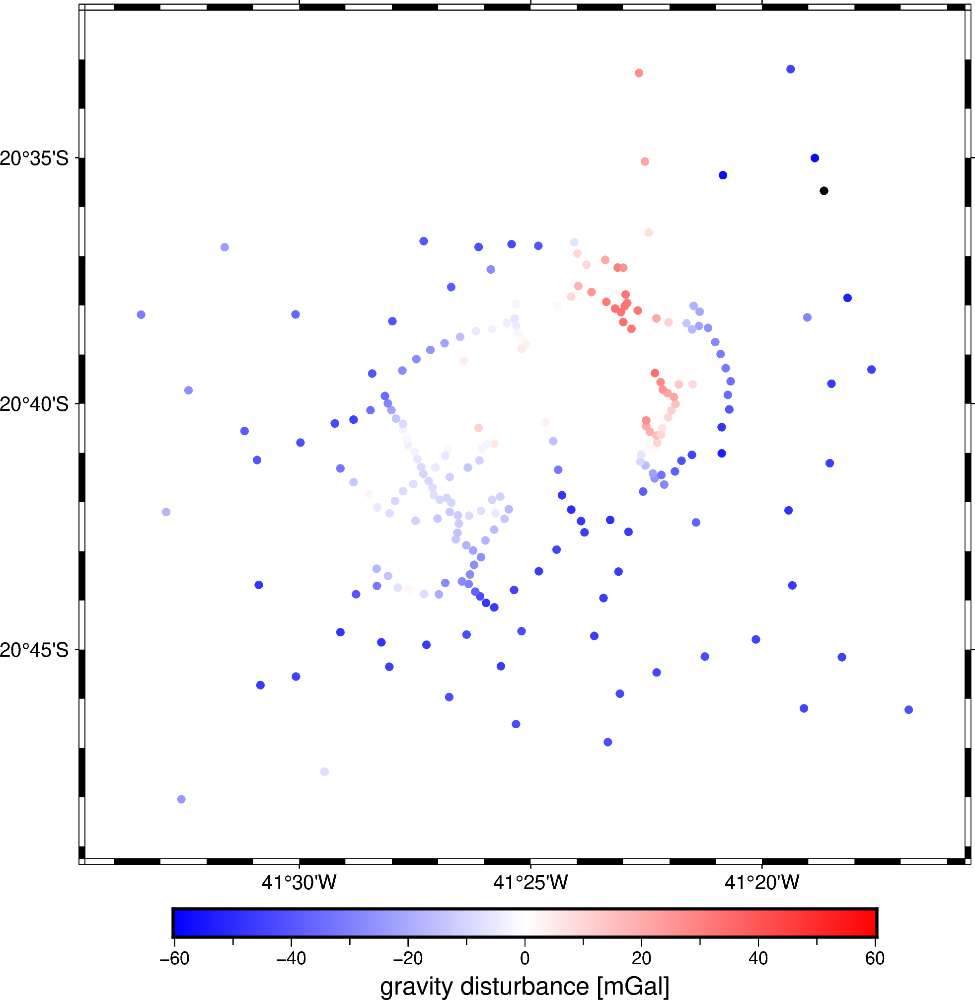

In [17]:
fig = pygmt.Figure()
maxabs = vd.maxabs(data.gravity_disturbance_mgal)
pygmt.makecpt(cmap="polar+h", series=[-maxabs, maxabs])
fig.plot(
    x=data.longitude,
    y=data.latitude,
    color=data.gravity_disturbance_mgal,
    cmap=True,
    style="c4p",
    projection="M15c",
    frame="af",
)
fig.colorbar(frame='af+l"gravity disturbance [mGal]"')
fig.show(width=600)

image

<!-- ## Correção topográfica -->

<!-- ![](https://www.fatiando.org/tutorials/_images/topographic-correction.svg) -->

In [18]:
# projection = pyproj.Proj(proj="merc", lat_ts=data.latitude.mean())
projection = pyproj.Proj(proj='utm', ellps='WGS84', zone=24, south=True)

In [19]:
easting, northing = projection(data.longitude.values, data.latitude.values)
data = data.assign(easting_m=easting, northing_m=northing)
data

,Station,Reading,Time,Date,height_sea_level_m,X,Y,longitude,latitude,gravity_mgal,TideCorr,Source,geoid_m,height_geometric_m,normal_gravity_mgal,gravity_disturbance_mgal,easting_m,northing_m
0,1,2239.39,14:28:00,2019/12/03,147.94,238246.104213,7.702141e+06,-41.514018,-20.762135,978591.406605,0.053423,03122019_996,-6.28,141.66,978637.965812,-46.559207,238246.104213,7.702141e+06
1,2,2239.41,15:12:00,2019/12/03,152.06,239573.565307,7.702483e+06,-41.501226,-20.759230,978591.445776,0.066119,03122019_996,-6.33,145.73,978636.535699,-45.089923,239573.565308,7.702483e+06
2,3,2246.38,16:06:00,2019/12/03,117.30,241216.748955,7.704176e+06,-41.485206,-20.744179,978598.473518,0.077715,03122019_996,-6.38,110.92,978646.381983,-47.908465,241216.748956,7.704176e+06
3,4,2245.71,16:46:00,2019/12/03,129.10,243071.287960,7.702906e+06,-41.467595,-20.755897,978597.809879,0.081974,03122019_996,-6.41,122.69,978643.448921,-45.639042,243071.287960,7.702906e+06
4,5,2249.62,17:13:00,2019/12/03,130.01,245332.547009,7.701803e+06,-41.446052,-20.766168,978601.745635,0.082319,03122019_996,-6.46,123.55,978643.797668,-42.052034,245332.547009,7.701803e+06
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,223,2203015.00,17:06:00,2019/12/16,264.94,245174.133206,7.717189e+06,-41.445344,-20.627243,978555.178643,0.096166,16122019_996,-6.15,258.79,978593.762447,-38.583804,245174.133206,7.717189e+06
223,224,2168435.00,09:38:00,2019/12/17,204.11,239604.189758,7.711266e+06,-41.499631,-20.679943,978573.732084,-0.030230,17122019_965,-6.24,197.87,978615.706191,-41.974106,239604.189759,7.711266e+06
224,225,2164.15,11:52:00,2019/12/17,226.73,237502.245723,7.711667e+06,-41.519734,-20.676036,978569.446411,0.024382,17122019_965,-6.20,220.53,978608.478307,-39.031896,237502.245723,7.711667e+06
225,226,2135695.00,15:49:00,2019/12/17,443.57,240697.890125,7.698939e+06,-41.490961,-20.791377,978540.768876,0.125092,17122019_965,-6.37,437.20,978548.487697,-7.718821,240697.890126,7.698939e+06


In [20]:
topography_proj = vd.project_grid(topography_geometric, projection, method="nearest")
# topography_proj.plot()

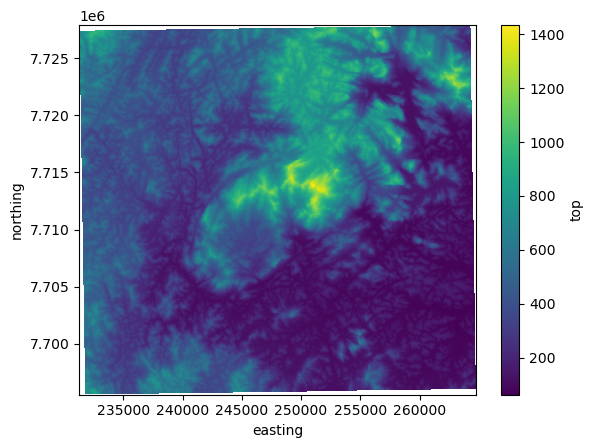

In [21]:
topography_density = np.where(topography_proj > 0, 2670, 1040 - 2670)
topography_model = hm.prism_layer(
    coordinates=(topography_proj.easting, topography_proj.northing),
    surface=topography_proj,
    reference=0,
    properties={"density": topography_density}
)

topography_model.top.plot()

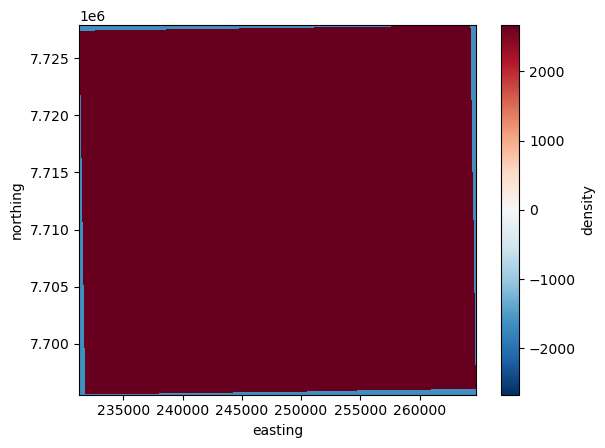

In [22]:
# fig = pygmt.Figure()
# scale = vd.maxabs(topography_model.density)
# pygmt.makecpt(cmap="roma+h", reverse=True, series=[-scale, scale])
# fig.grdimage(topography_model.density, projection="X15c/15c", frame=True)
# fig.colorbar(frame='af+l"Density of the prism model [kg/m3]"')
# fig.show()

topography_model.density.plot()

In [23]:
coordinates = (data.easting_m, data.northing_m, data.height_geometric_m)
terrain_effect = topography_model.prism_layer.gravity(coordinates, field="g_z")

In [24]:
data = data.assign(
    gravity_bouguer_mgal=data.gravity_disturbance_mgal - terrain_effect
)
data

,Station,Reading,Time,Date,height_sea_level_m,X,Y,longitude,latitude,gravity_mgal,TideCorr,Source,geoid_m,height_geometric_m,normal_gravity_mgal,gravity_disturbance_mgal,easting_m,northing_m,gravity_bouguer_mgal
0,1,2239.39,14:28:00,2019/12/03,147.94,238246.104213,7.702141e+06,-41.514018,-20.762135,978591.406605,0.053423,03122019_996,-6.28,141.66,978637.965812,-46.559207,238246.104213,7.702141e+06,-57.463879
1,2,2239.41,15:12:00,2019/12/03,152.06,239573.565307,7.702483e+06,-41.501226,-20.759230,978591.445776,0.066119,03122019_996,-6.33,145.73,978636.535699,-45.089923,239573.565308,7.702483e+06,-57.779299
2,3,2246.38,16:06:00,2019/12/03,117.30,241216.748955,7.704176e+06,-41.485206,-20.744179,978598.473518,0.077715,03122019_996,-6.38,110.92,978646.381983,-47.908465,241216.748956,7.704176e+06,-58.255253
3,4,2245.71,16:46:00,2019/12/03,129.10,243071.287960,7.702906e+06,-41.467595,-20.755897,978597.809879,0.081974,03122019_996,-6.41,122.69,978643.448921,-45.639042,243071.287960,7.702906e+06,-55.987597
4,5,2249.62,17:13:00,2019/12/03,130.01,245332.547009,7.701803e+06,-41.446052,-20.766168,978601.745635,0.082319,03122019_996,-6.46,123.55,978643.797668,-42.052034,245332.547009,7.701803e+06,-53.470713
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,223,2203015.00,17:06:00,2019/12/16,264.94,245174.133206,7.717189e+06,-41.445344,-20.627243,978555.178643,0.096166,16122019_996,-6.15,258.79,978593.762447,-38.583804,245174.133206,7.717189e+06,-62.091698
223,224,2168435.00,09:38:00,2019/12/17,204.11,239604.189758,7.711266e+06,-41.499631,-20.679943,978573.732084,-0.030230,17122019_965,-6.24,197.87,978615.706191,-41.974106,239604.189759,7.711266e+06,-60.522518
224,225,2164.15,11:52:00,2019/12/17,226.73,237502.245723,7.711667e+06,-41.519734,-20.676036,978569.446411,0.024382,17122019_965,-6.20,220.53,978608.478307,-39.031896,237502.245723,7.711667e+06,-60.590027
225,226,2135695.00,15:49:00,2019/12/17,443.57,240697.890125,7.698939e+06,-41.490961,-20.791377,978540.768876,0.125092,17122019_965,-6.37,437.20,978548.487697,-7.718821,240697.890126,7.698939e+06,-53.421347


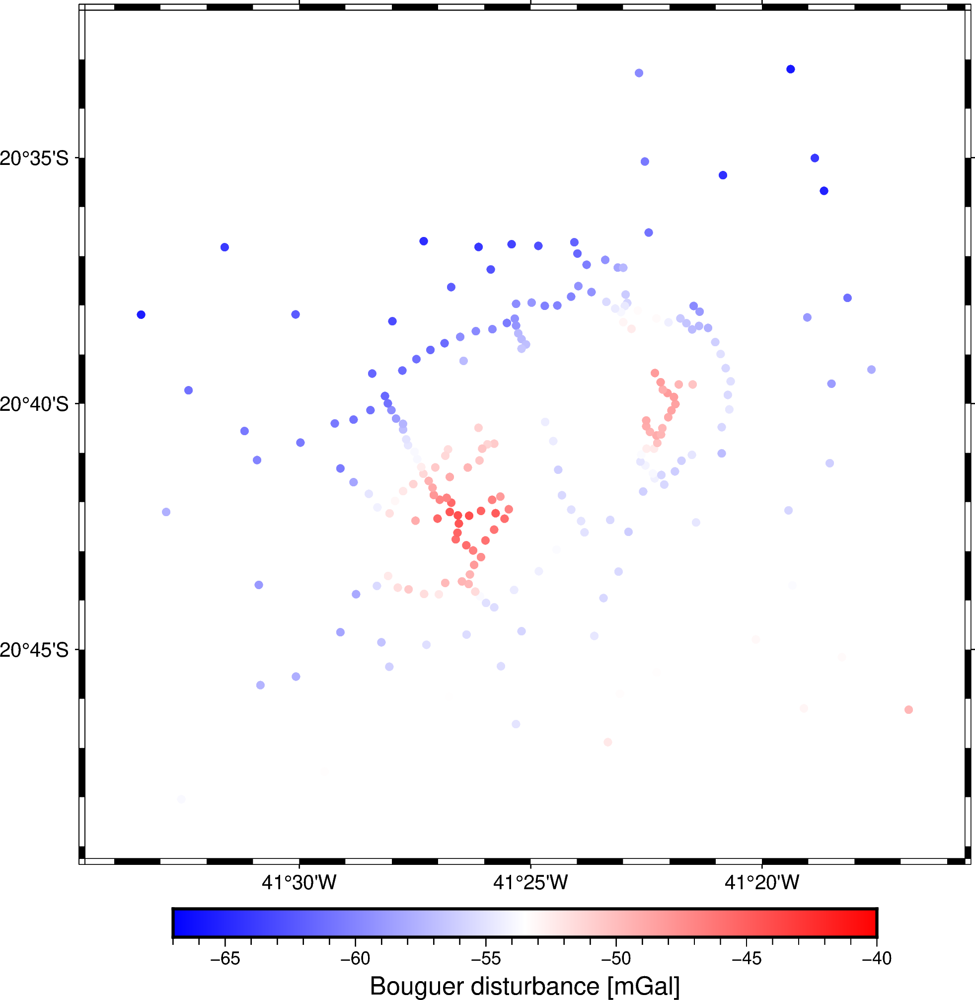

In [25]:
fig = pygmt.Figure()
maxabs = vd.maxabs(data.gravity_bouguer_mgal)
pygmt.makecpt(cmap="polar", series=[-67, -40])
fig.plot(
    x=data.longitude,
    y=data.latitude,
    color=data.gravity_bouguer_mgal,
    cmap=True,
    style="c4p",
    projection="M15c",
    frame=True,
)
fig.colorbar(frame='af+l"Bouguer disturbance [mGal]"')
fig.show()

## Separação regional residual

In [26]:
regional = vd.Trend(degree=1).fit(coordinates, data.gravity_bouguer_mgal)
data = data.assign(
    regional_mgal=regional.predict(coordinates),
)
data = data.assign(
    residual_mgal=data.gravity_bouguer_mgal - data.regional_mgal,
)
data

,Station,Reading,Time,Date,height_sea_level_m,X,Y,longitude,latitude,gravity_mgal,...,Source,geoid_m,height_geometric_m,normal_gravity_mgal,gravity_disturbance_mgal,easting_m,northing_m,gravity_bouguer_mgal,regional_mgal,residual_mgal
0,1,2239.39,14:28:00,2019/12/03,147.94,238246.104213,7.702141e+06,-41.514018,-20.762135,978591.406605,...,03122019_996,-6.28,141.66,978637.965812,-46.559207,238246.104213,7.702141e+06,-57.463879,-51.394294,-6.069584
1,2,2239.41,15:12:00,2019/12/03,152.06,239573.565307,7.702483e+06,-41.501226,-20.759230,978591.445776,...,03122019_996,-6.33,145.73,978636.535699,-45.089923,239573.565308,7.702483e+06,-57.779299,-51.348353,-6.430946
2,3,2246.38,16:06:00,2019/12/03,117.30,241216.748955,7.704176e+06,-41.485206,-20.744179,978598.473518,...,03122019_996,-6.38,110.92,978646.381983,-47.908465,241216.748956,7.704176e+06,-58.255253,-52.011885,-6.243369
3,4,2245.71,16:46:00,2019/12/03,129.10,243071.287960,7.702906e+06,-41.467595,-20.755897,978597.809879,...,03122019_996,-6.41,122.69,978643.448921,-45.639042,243071.287960,7.702906e+06,-55.987597,-50.955379,-5.032218
4,5,2249.62,17:13:00,2019/12/03,130.01,245332.547009,7.701803e+06,-41.446052,-20.766168,978601.745635,...,03122019_996,-6.46,123.55,978643.797668,-42.052034,245332.547009,7.701803e+06,-53.470713,-49.919612,-3.551100
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
222,223,2203015.00,17:06:00,2019/12/16,264.94,245174.133206,7.717189e+06,-41.445344,-20.627243,978555.178643,...,16122019_996,-6.15,258.79,978593.762447,-38.583804,245174.133206,7.717189e+06,-62.091698,-58.683840,-3.407858
223,224,2168435.00,09:38:00,2019/12/17,204.11,239604.189758,7.711266e+06,-41.499631,-20.679943,978573.732084,...,17122019_965,-6.24,197.87,978615.706191,-41.974106,239604.189759,7.711266e+06,-60.522518,-56.329669,-4.192849
224,225,2164.15,11:52:00,2019/12/17,226.73,237502.245723,7.711667e+06,-41.519734,-20.676036,978569.446411,...,17122019_965,-6.20,220.53,978608.478307,-39.031896,237502.245723,7.711667e+06,-60.590027,-56.937405,-3.652623
225,226,2135695.00,15:49:00,2019/12/17,443.57,240697.890125,7.698939e+06,-41.490961,-20.791377,978540.768876,...,17122019_965,-6.37,437.20,978548.487697,-7.718821,240697.890126,7.698939e+06,-53.421347,-49.132898,-4.288449


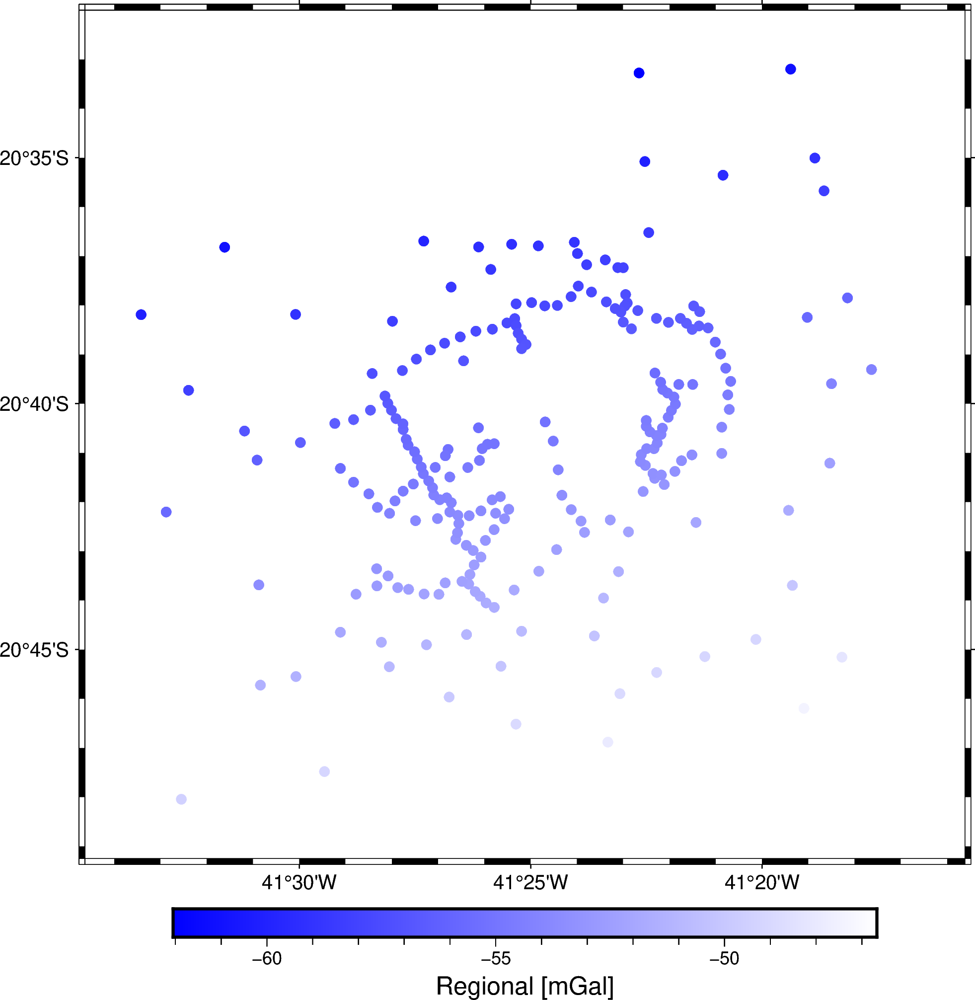

In [27]:
fig = pygmt.Figure()
maxabs = vd.maxabs(data.regional_mgal)
pygmt.makecpt(cmap="polar+h", series=[data.regional_mgal.min(), data.regional_mgal.max()])
fig.plot(
    x=data.longitude,
    y=data.latitude,
    color=data.regional_mgal,
    cmap=True,
    style="c5p",
    projection="M15c",
    frame=True,
)
fig.colorbar(frame='af+l"Regional [mGal]"')
fig.show()

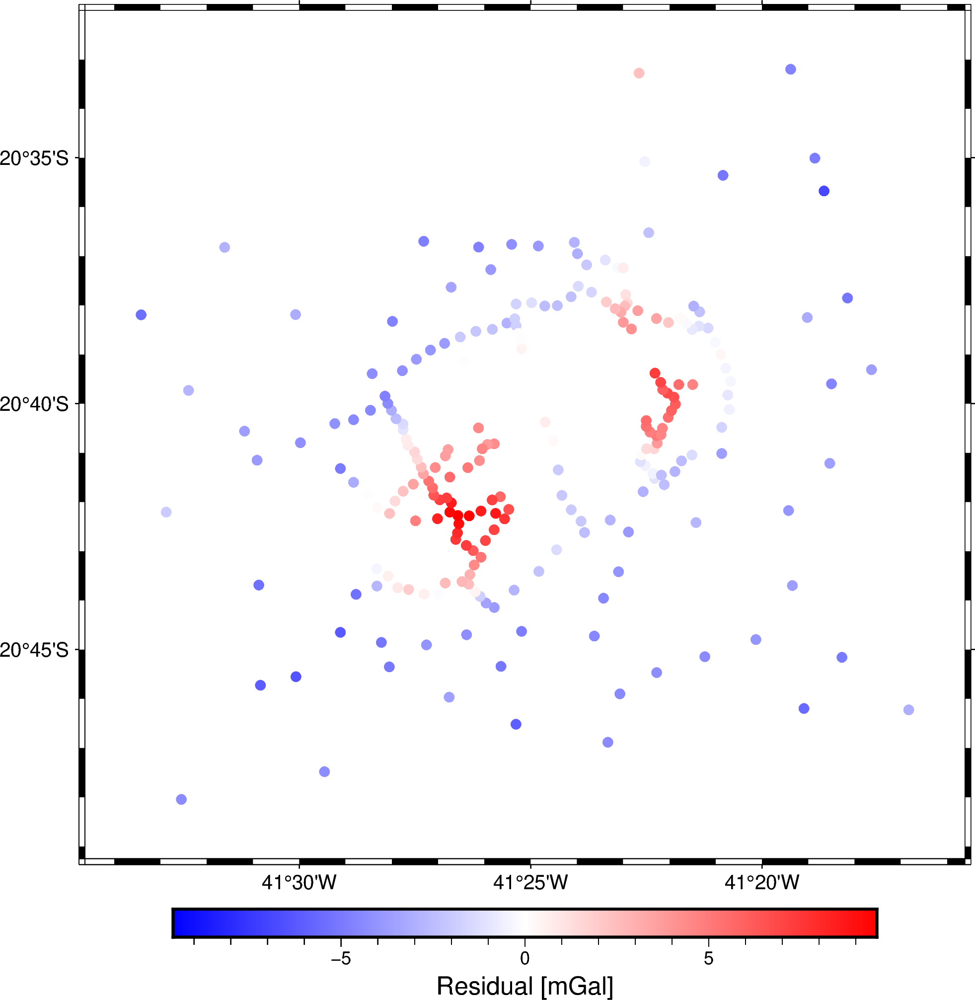

In [28]:
fig = pygmt.Figure()
maxabs = vd.maxabs(data.residual_mgal)
pygmt.makecpt(cmap="polar", series=[-maxabs, maxabs])
fig.plot(
    x=data.longitude,
    y=data.latitude,
    color=data.residual_mgal,
    cmap=True,
    style="c5p",
    projection="M15c",
    frame=True,
)
fig.colorbar(frame='af+l"Residual [mGal]"')
fig.show()

ERROR 1: Features without geometry not supported by GMT writer.
ERROR 1: Features without geometry not supported by GMT writer.
ERROR 1: Features without geometry not supported by GMT writer.


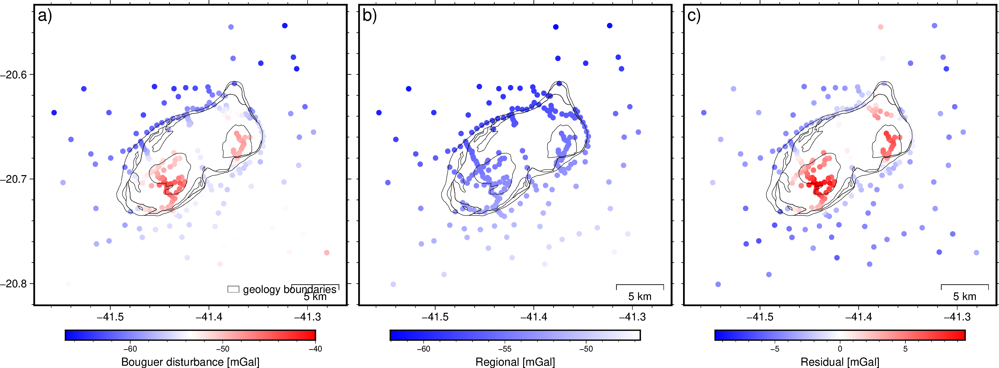

In [29]:
with plt.rc_context(mpl_rc):
    fig = pygmt.Figure()
    # fig.subplot(nrows=1, ncols=3, figsize=("15c", "5c"), frame="a")
    with fig.subplot(
        nrows=1, ncols=3, figsize=("32c", "10c"), autolabel=True, margins="-0.05c"
    ):
        with fig.set_panel(panel=0):
            maxabs = vd.maxabs(data.gravity_bouguer_mgal)
            pygmt.makecpt(cmap="polar", series=[-67, -40])
            fig.plot(
                x=data.longitude,
                y=data.latitude,
                color=data.gravity_bouguer_mgal,
                cmap=True,
                style="c5p",
                projection="X",
                frame=["WSne", "xaf", "yaf"],
            )
            fig.colorbar(frame='af+l"Bouguer disturbance [mGal]"')
            fig.plot(data=GranitoFoliado, projection='M', label='geology boundaries')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.legend(box=False, position="JBR+jBR+o0.2c")
            fig.basemap(map_scale="n0.9/0.06+w5k+u")
    
        with fig.set_panel(panel=1):
            maxabs = vd.maxabs(data.regional_mgal)
            pygmt.makecpt(cmap="polar+h", series=[data.regional_mgal.min(), data.regional_mgal.max()])
            fig.plot(
                x=data.longitude,
                y=data.latitude,
                color=data.regional_mgal,
                cmap=True,
                style="c5p",
                projection="X",
                frame=["WSne", "xaf", "f"],
            )
            fig.colorbar(frame='af+l"Regional [mGal]"')

            fig.plot(data=GranitoFoliado, projection='M')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.basemap(map_scale="n0.9/0.06+w5k+u")
    
        with fig.set_panel(panel=2):
            maxabs = vd.maxabs(data.residual_mgal)
            pygmt.makecpt(cmap="polar", series=[-maxabs, maxabs])
            fig.plot(
                x=data.longitude,
                y=data.latitude,
                color=data.residual_mgal,
                cmap=True,
                style="c5p",
                projection="X",
                frame=["WSne", "xaf", "f"],
            )
            fig.colorbar(frame='af+l"Residual [mGal]"')
            
            fig.plot(data=GranitoFoliado, projection='M')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.basemap(map_scale="n0.9/0.06+w5k+u")


fig.savefig(image_dir/'gravity.png', dpi=300)
fig.show()


## Interpolação com fontes equivalentes

In [30]:
eqs = hm.EquivalentSources(damping=1.0, depth=2e3)
eqs.fit((data.easting_m, data.northing_m, data.height_geometric_m), data.residual_mgal)

EquivalentSources(damping=1.0, depth=2000.0)

In [31]:
# Interpolar extra coord a partir da topografia
region_pad_2 = vd.pad_region(region, pad=-0.01)
grid_extra_coord = vd.grid_coordinates(region, spacing= 2 / 3600)


interpolator = vd.KNeighbors()
topography_table = vd.grid_to_table(topography)
interpolator.fit((topography_table.longitude, topography_table.latitude), topography_table.elevation)
extra_coord=interpolator.predict((grid_extra_coord[0], grid_extra_coord[1]))

# geoid_values = np.reshape(geoid_1.elevation, topography.shape)
coordinates_grid = ([grid_extra_coord[0], grid_extra_coord[1], extra_coord])

In [32]:
residual_grid = eqs.grid(
    # coordinates=vd.grid_coordinates(region, spacing=2 / 3600, extra_coords=1.5e3),
    coordinates=coordinates_grid,
    data_names="gravity_residual",
    dims=("latitude", "longitude"),
    projection=projection,
)
residual_grid

<xarray.Dataset>
Dimensions:           (latitude: 447, longitude: 499)
Coordinates:
  * longitude         (longitude) float64 -41.56 -41.56 -41.56 ... -41.28 -41.28
  * latitude          (latitude) float64 -20.8 -20.8 -20.8 ... -20.55 -20.55
    upward            (latitude, longitude) float32 384.0 377.0 ... 550.0 573.0
Data variables:
    gravity_residual  (latitude, longitude) float64 -3.667 -3.696 ... -3.02
Attributes:
    metadata:  Generated by EquivalentSources(damping=1.0, depth=2000.0)

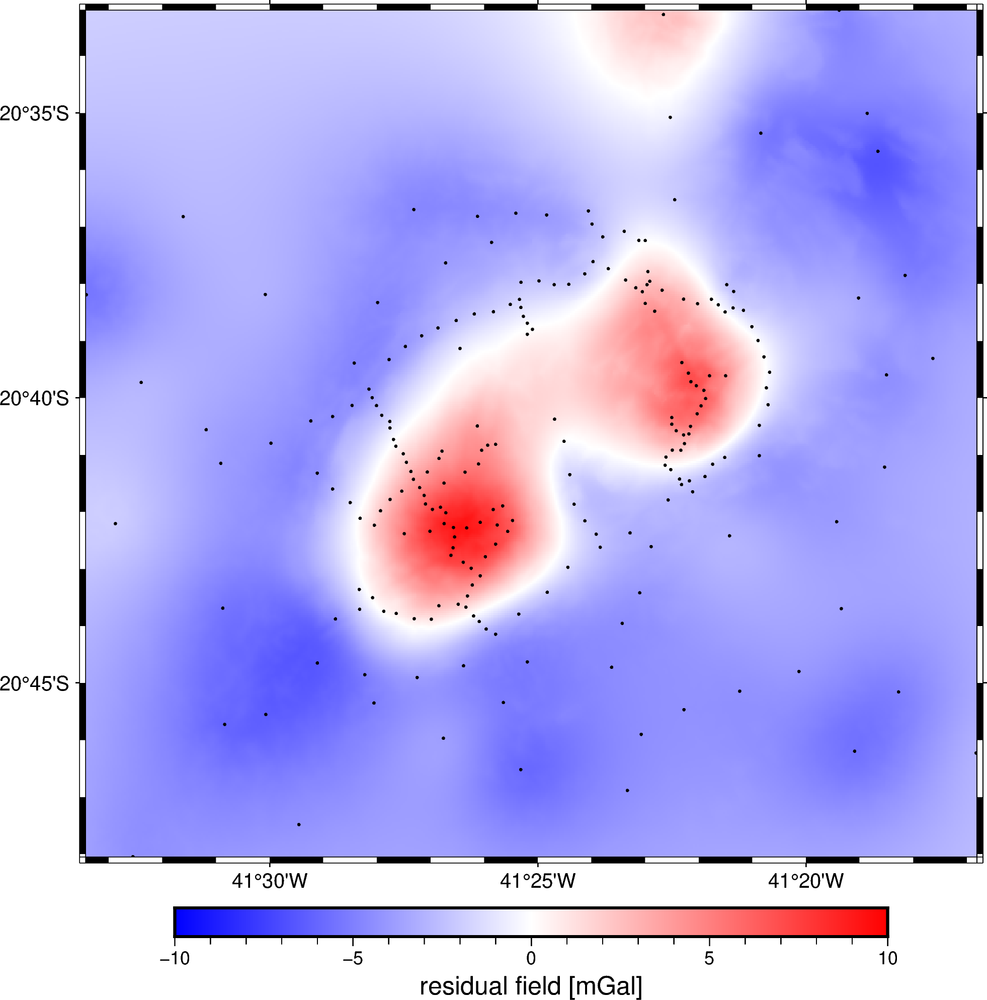

In [33]:
fig = pygmt.Figure()
scale = vd.maxabs(residual_grid.gravity_residual)
pygmt.makecpt(cmap="polar", series=[-10, 10], no_bg=True)
fig.grdimage(
    residual_grid.gravity_residual,
    # shading="+a45+nt0.15",
    projection="M15c",
    frame=True,
    region=region
)
fig.colorbar(frame='af+l"residual field [mGal]"')
fig.plot(
    x=data.longitude,
    y=data.latitude,
    style="c0.05c",
    color="black",
)
fig.show()

In [34]:
### Validação cruzada entre dados de grav residual e camada equivalente
r2_score = np.mean(
    vd.cross_val_score(
        eqs,
        coordinates,
        data.residual_mgal,
    )
)
print(f'O R² do modelo de camada equivalente para os dados é de: {r2_score:.3f}')

O R² do modelo de camada equivalente para os dados é de: 0.952


## image
<!-- ![](https://www.fatiando.org/tutorials/_images/bushveld_igneous_complex_geology.jpg) -->

# Calculate derivatives and gradients (new)

## Calculate derivatives

In [35]:
# grid_coords = vd.grid_coordinates(region, spacing=2 / 60, extra_coords=2.3e3)
g_east, g_north = projection(*coordinates_grid[:2])
g_up = coordinates_grid[2]

delta = 10
deast = (
      eqs.predict((g_east + delta, g_north, g_up))
    - eqs.predict((g_east - delta, g_north, g_up))
) / (2 * delta)

dnorth = (
      eqs.predict((g_east, g_north + delta, g_up))
    - eqs.predict((g_east, g_north - delta, g_up))
) / (2 * delta)



delta = 5
dup = (
      eqs.predict((g_east, g_north, g_up + delta))
    - eqs.predict((g_east, g_north, g_up - delta))
) / (2 * delta)


derivatives = vd.make_xarray_grid(coordinates_grid, (deast, dnorth, -dup), 
                                  data_names=["derivative_easting", "derivative_northing", "derivative_upward"],
                                  extra_coords_names="upward")

derivatives.derivative_easting.attrs = {"units": "mGal/m"}
derivatives.derivative_northing.attrs = {"units": "mGal/m"}
derivatives.derivative_upward.attrs = {"units": "mGal/m"}


## Calculate total and horizontal gradients

In [36]:
derivatives = derivatives.assign(TG=np.sqrt(derivatives.derivative_easting**2  +
                                            derivatives.derivative_northing**2 +
                                            derivatives.derivative_upward**2
                                               ))

derivatives = derivatives.assign(HG=np.sqrt(derivatives.derivative_easting**2  +
                                            derivatives.derivative_northing**2
                                               ))

derivatives.HG.attrs = {"units": "mGal/m"}
derivatives.TG.attrs = {"units": "mGal/m"}

In [37]:
derivatives

<xarray.Dataset>
Dimensions:              (northing: 447, easting: 499)
Coordinates:
  * easting              (easting) float64 -41.56 -41.56 ... -41.28 -41.28
  * northing             (northing) float64 -20.8 -20.8 -20.8 ... -20.55 -20.55
    upward               (northing, easting) float32 384.0 377.0 ... 550.0 573.0
Data variables:
    derivative_easting   (northing, easting) float64 -0.0004507 ... 0.0002447
    derivative_northing  (northing, easting) float64 -0.000136 ... 0.0002197
    derivative_upward    (northing, easting) float64 -0.0004596 ... -0.0001868
    TG                   (northing, easting) float64 0.0006579 ... 0.0003782
    HG                   (northing, easting) float64 0.0004708 ... 0.0003288

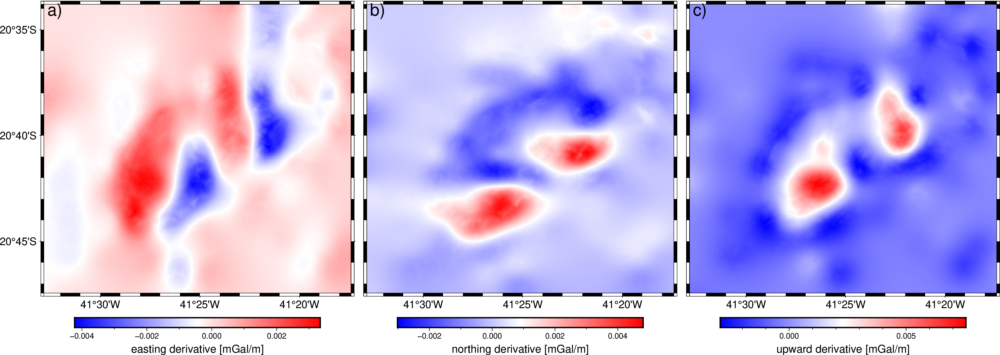

In [38]:
fig = pygmt.Figure()
# fig.subplot(nrows=1, ncols=3, figsize=("15c", "5c"), frame="a")
with fig.subplot(
    nrows=1, ncols=3, figsize=("32c", "10c"), autolabel=True, margins="0.01c"
):
    with fig.set_panel(panel=0):
        fig.grdimage(derivatives.derivative_easting, projection="M", cmap="polar", frame=["WSne", "xaf", "yaf"],
                    region= region_pad_2)# frame=["WSne", "xafg+lx-axis", "yafg+ly-axis"])
        fig.colorbar(frame='af+l"easting derivative [mGal/m]"')

    with fig.set_panel(panel=1):
        fig.grdimage(derivatives.derivative_northing, projection="M", cmap="polar", frame=["WSne", "xaf+lx-axis", "f+ly-axis"],
                    region= region_pad_2)
        fig.colorbar(frame='af+l"northing derivative [mGal/m]"')

    with fig.set_panel(panel=2):
        fig.grdimage(derivatives.derivative_upward, projection="M", cmap="polar", frame=["WSne", "xaf+lx-axis", "f+ly-axis"],
                    region= region_pad_2)
        fig.colorbar(frame='af+l"upward derivative [mGal/m]"')

# fig.savefig('teste.png', dpi=300)
fig.show()


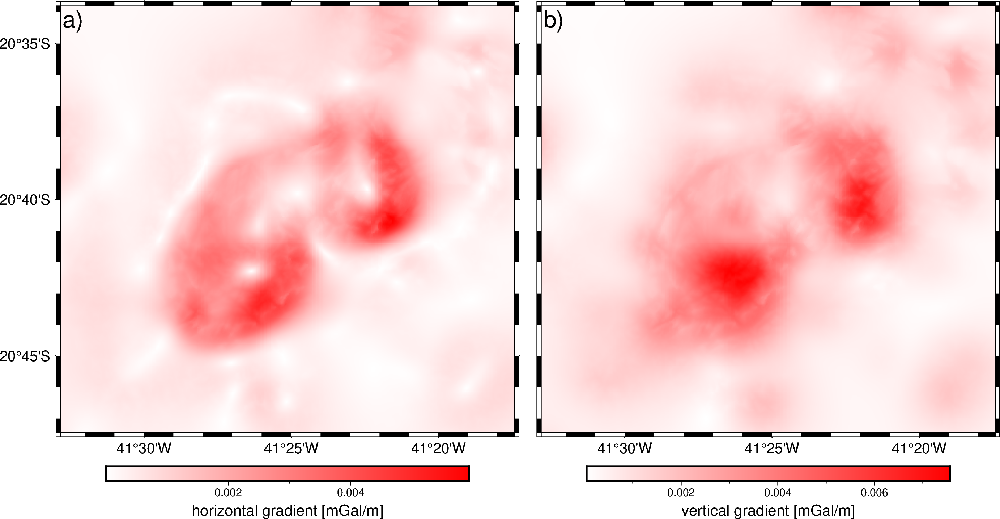

In [39]:
fig = pygmt.Figure()
# fig.subplot(nrows=1, ncols=3, figsize=("15c", "5c"), frame="a")
with fig.subplot(
    nrows=1, ncols=2, figsize=("22c", "10c"), autolabel=True, margins="0.01c"
):
    with fig.set_panel(panel=0):
        fig.grdimage(derivatives.HG, projection="M", cmap="polar+h", frame=["WSne", "xaf", "yaf"],
                    region= region_pad_2)# frame=["WSne", "xafg+lx-axis", "yafg+ly-axis"])
        fig.colorbar(frame='af+l"horizontal gradient [mGal/m]"')

    with fig.set_panel(panel=1):
        fig.grdimage(derivatives.TG, projection="M", cmap="polar+h", frame=["WSne", "xaf+lx-axis", "f+ly-axis"],
                    region= region_pad_2)
        fig.colorbar(frame='af+l"vertical gradient [mGal/m]"')

fig.show()

## Report's plot

ERROR 1: Features without geometry not supported by GMT writer.
ERROR 1: Features without geometry not supported by GMT writer.
ERROR 1: Features without geometry not supported by GMT writer.
ERROR 1: Features without geometry not supported by GMT writer.
ERROR 1: Features without geometry not supported by GMT writer.
ERROR 1: Features without geometry not supported by GMT writer.


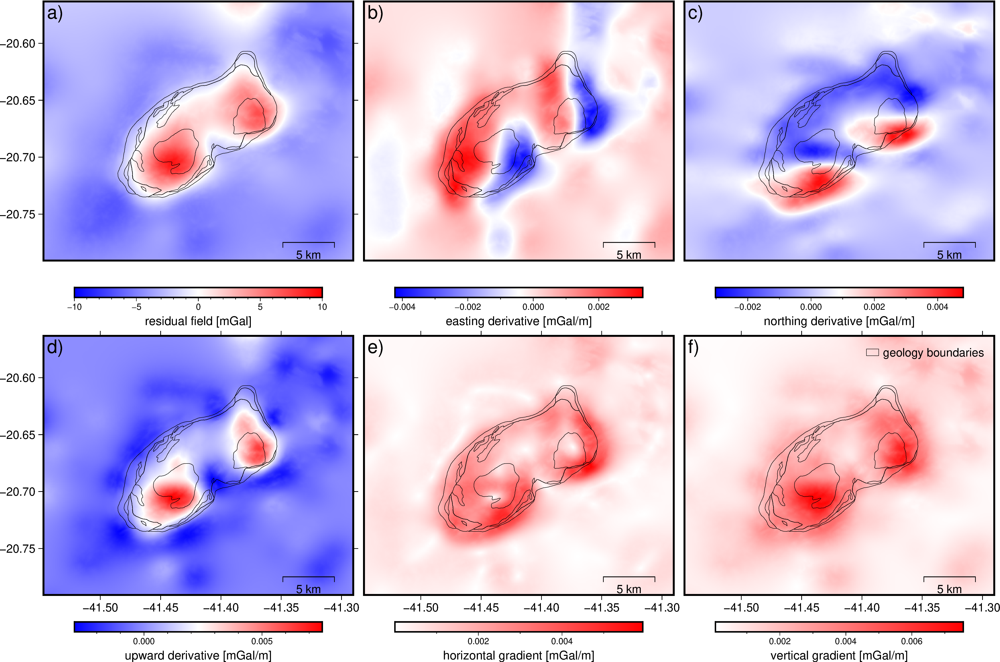

In [40]:
with plt.rc_context(mpl_rc):

    fig = pygmt.Figure()
    with fig.subplot(
        nrows=2, ncols=3, figsize=("32c", "20c"), autolabel=True, margins="-0.1c/0.99c"
    ):
        
        with fig.set_panel(panel=0):
            scale = vd.maxabs(residual_grid.gravity_residual)
            pygmt.makecpt(cmap="polar", series=[-10, 10], no_bg=True)
            fig.grdimage(
                residual_grid.gravity_residual,
                # shading="+a45+nt0.15",
                projection="X",
                frame=["WSne", "xf2.5", "yaf2.5"],
                region=region_pad_2
            )
            fig.colorbar(frame='af+l"residual field [mGal]"')
            fig.plot(data=GranitoFoliado, projection='M')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.basemap(map_scale="n0.9/0.06+w5k+u")
        
        with fig.set_panel(panel=1):
            fig.grdimage(derivatives.derivative_easting, projection="X", cmap="polar", frame=["WSne", "xf2.5", "yf2.5"],
                        region= region_pad_2)# frame=["WSne", "xafg+lx-axis", "yafg+ly-axis"])
            fig.colorbar(frame='af+l"easting derivative [mGal/m]"')
            # fig.text(text='b)', position='TL',  font=16)
            fig.plot(data=GranitoFoliado, projection='M')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.basemap(map_scale="n0.9/0.06+w5k+u")
        
    
        with fig.set_panel(panel=2):
            fig.grdimage(derivatives.derivative_northing, projection="X", cmap="polar", frame=["WSne", "xf2.5", "f2.5"],
                        region= region_pad_2)
            fig.colorbar(frame='af+l"northing derivative [mGal/m]"')
            fig.plot(data=GranitoFoliado, projection='M')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.basemap(map_scale="n0.9/0.06+w5k+u")

        
        with fig.set_panel(panel=3):
            fig.grdimage(derivatives.derivative_upward, projection="X", cmap="polar",  frame=["WSne", "xaf2.5", "yaf2.5"],
                        region= region_pad_2)
            fig.colorbar(frame='af+l"upward derivative [mGal/m]"')
            fig.plot(data=GranitoFoliado, projection='M')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.basemap(map_scale="n0.9/0.06+w5k+u")

        with fig.set_panel(panel=4):
            fig.grdimage(derivatives.HG, projection="X", cmap="polar+h", frame=["WSne", "xaf2.5", "yf2.5"],
                        region= region_pad_2)# frame=["WSne", "xafg+lx-axis", "yafg+ly-axis"])
            fig.colorbar(frame='af+l"horizontal gradient [mGal/m]"')
            fig.plot(data=GranitoFoliado, projection='M')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.basemap(map_scale="n0.9/0.06+w5k+u")
    
        with fig.set_panel(panel=5):
            fig.grdimage(derivatives.TG, projection="X", cmap="polar+h", frame=["WSne", "xaf2.5", "f2.5"],
                        region= region_pad_2)
            fig.colorbar(frame='af+l"vertical gradient [mGal/m]"')
            fig.plot(data=GranitoFoliado, projection='M', label='geology boundaries')
            fig.plot(data=Mistura, projection='M')
            fig.plot(data=Nucleo1, projection='M')
            fig.plot(data=Nocleo2, projection='M')
            fig.legend(box=False, position="JTR+jTR+o0.2c")
            fig.basemap(map_scale="n0.9/0.06+w5k+u")

fig.savefig(image_dir/'painel_final.png', dpi=300)
fig.show()